# CASA Summary
The pipeline used for calibration and flagging closely follows that of the CASA pipeline (https://casaguides.nrao.edu/index.php?title=VLA-S-CASA_Pipeline-CASA6.2.1#Stage_7._hifv_checkflag:_Flag_possible_RFI_on_BP_calibrator_using_rflag). This notebook summarises the output of the pipeline (calibration tables, flagging summaries, data plots) and can be used to get an overview of the data and identify bad data that needs to be flagged manually.

In [1]:
import os
import sys
import h5py
import yaml
import casatasks
import numpy as np
from astropy.time import Time
import astropy.units as u
from ipywidgets import interact

import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import matplotlib as mpl

cmap = mpl.cm.viridis  
cmap.set_bad(color='red')

from IPython.display import Image

# read yaml file
with open("../input/config.yaml", "r") as file:
    conf = yaml.safe_load(file)
    
sys.path.append(os.path.join(os.curdir, "../"))

from vlapy import vladata, inspect

## Obervation Information 
The data below is the output of CASA's listobs task and can be used to fill in the yaml file "obs.yaml", which contains all the parameters for the pipeline.

In [2]:
obs = conf["obs list"][7]
root = os.path.join(conf["root"], f"{obs}")
name = obs.split(".")[0]

ms = os.path.join(root, f"{obs}_hanning.ms")
vladata.listobs(ms)

BeginTime
58740.68548611111 

EndTime
58740.82094907406 

IntegrationTime
11703.999999046326 

field_0
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -2.7439275295795866}, 'm1': {'unit': 'rad', 'value': 0.5324852109}, 'refer': 'J2000', 'type': 'direction'}
name :  3C286


field_1
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': 2.8732195711}, 'm1': {'unit': 'rad', 'value': 0.0273377888}, 'refer': 'J2000', 'type': 'direction'}
name :  J1058+0133


field_10
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -3.1370097098795866}, 'm1': {'unit': 'rad', 'value': 0.0273260383}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J1201+0133


field_11
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -3.1194051554795865}, 'm1': {'unit': 'rad', 'value': -0.0001356024}, 'refer': 'J2000', 'type': 'direction'}
name :  QSO J1205-0000


field_12
code :  NONE
direction :  {'m0': {'unit': 'rad', 'value': -3.107112219779587}, 'm1': {'unit': 'rad', 'value': -0.00171284

### Array Layout

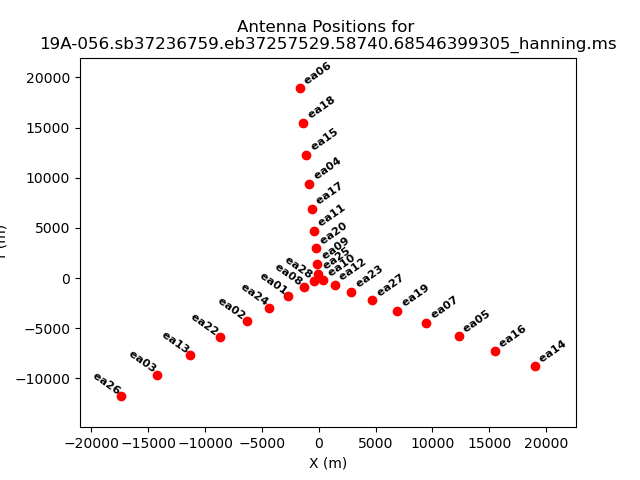

In [3]:
Image(filename=root + "/plots/obsplots/antlayout.png")

### Plot Elevation vs. Time
Observations low in elevation might see more RFI. The plot is colorised by field. Each target field is in between two phase calibrators.

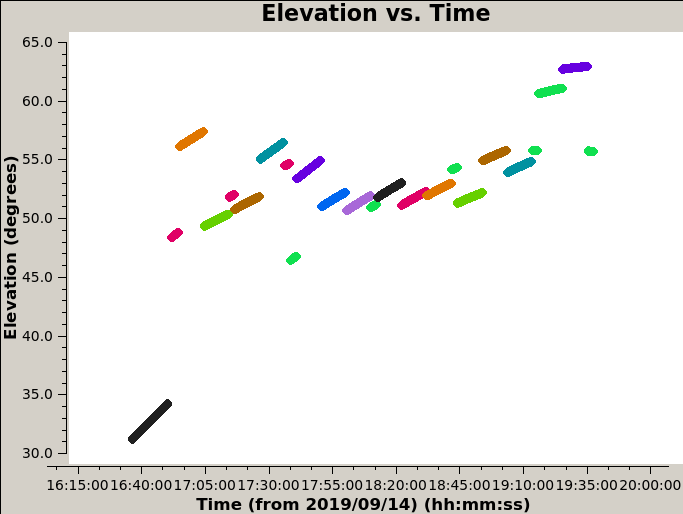

In [4]:
Image(filename=root + "/plots/obsplots/elevation_vs_time.png")

## VLA Deterministic Flags and Manual Flags
These include antennas not on source, shadowed antennas, scans with non-relevant intents, autocorrelations, edge channels of spectral windows, edge channels of the baseband, clipping absolute zero values produced by the correlator and the first few integrations of a scan (quacking). Manual flags are also applied for data known to be bad (RFI, obs reports). Below is a summary of the flags before and after applying the deterministic flags. Use the flagging frequency to find a suitable reference antenna and specify it in the yaml file.

In [5]:
summary_before = np.load(root + "/output/detflag_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/detflag_summary_after.npy", allow_pickle='TRUE').item()

# print flagging summary
def print_summary(item):
    for subitem in summary_before[item]:
        print(f"{item} {subitem}")
        print(
            "Before: {:.4f}, After: {:.4f}".format(
                100.0 * summary_before[item][subitem]["flagged"] / summary_before[item][subitem]["total"],
                100.0 * summary_after[item][subitem]["flagged"] / summary_after[item][subitem]["total"],
            )
        )
        print("")
        
print("Flag occupancy (percent) before and after deterministic flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after deterministic flags:

field 3C286
Before: 8.8271, After: 18.9591

field J1058+0133
Before: 24.4704, After: 31.9654

field J1150-0023
Before: 14.3026, After: 23.0369

field QSO J1030+0524
Before: 6.3606, After: 15.6459

field QSO J1036-0232
Before: 6.8035, After: 16.0459

field QSO J1048-0109
Before: 4.6592, After: 14.1148

field QSO J1120+0641
Before: 7.3252, After: 16.5162

field QSO J1137+0045
Before: 5.4323, After: 14.8107

field QSO J1148+0702
Before: 6.0711, After: 15.3854

field QSO J1152+0055
Before: 4.6580, After: 14.1137

field QSO J1201+0133
Before: 4.6403, After: 14.0980

field QSO J1205-0000
Before: 4.1145, After: 13.6228

field QSO J1207+0630
Before: 3.8077, After: 13.6043

field QSO J1207-0005
Before: 3.7566, After: 13.6066

field QSO J1208-0200
Before: 4.9679, After: 14.3931

field QSO J1212+0505
Before: 5.7914, After: 15.1348

field QSO J1217+0131
Before: 4.4089, After: 13.8879

field QSO J1231+0052
Before: 4.4496, After: 13.925

### Plot Online Flags
Plot flaggingreason vs. time. This shows which antennas are flagged due to focus errors, subreflector errors and antenna not on source. This plot can help identify suitable reference antennas.

In [6]:
if os.path.exists(root+"/plots/dataplots/flaggingreason_vs_time.png"):
    Image(filename=root+"/plots/dataplots/flaggingreason_vs_time.png")

### Plot Antenna Data Stream
If an antenna has missing data, it should not be used as a reference.

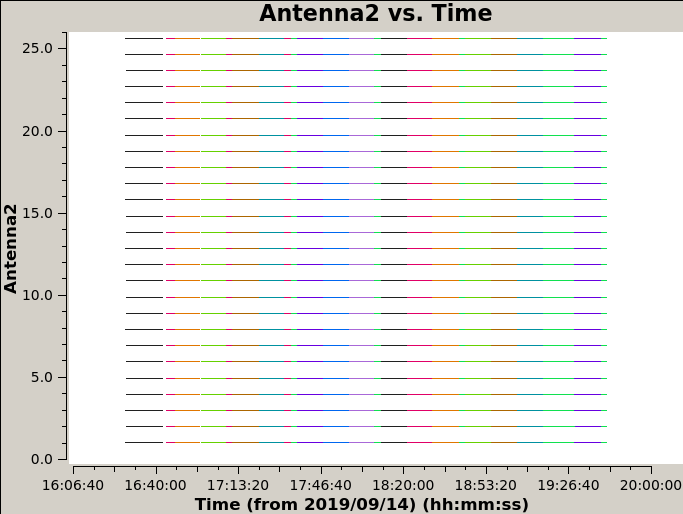

In [7]:
Image(filename=root + "/plots/obsplots/data_stream.png")

## Find Dead Antennas
Antennas that have low power should be flagged. This is also a good time to check for suitable reference antennas.

In [8]:
def plot_dead_ants(ant):
    plotfile = root + f"/plots/dataplots/find_dead_ants_amp_vs_freq_ant_{ant}.png"
    img = mpimg.imread(plotfile)
    plt.imshow(img)
    
interact(plot_dead_ants, ant=(1, 26))
    

interactive(children=(IntSlider(value=13, description='ant', max=26, min=1), Output()), _dom_classes=('widget-…

<function __main__.plot_dead_ants(ant)>

## RFI Inspection
The visibility amplitudes are first averaged across baselines and polarisation products. A modified Z-score is then computed across time as $Z_i = \frac{x_i - \mathrm{med}\{x_i\}_i}{\sigma_\mathrm{MAD}}$, 

where $\sigma_\mathrm{MAD} = \mathrm{med}\{\left|x_i - \mathrm{med}\{x_i\}_i\right|\}$ is the Median Absolute Deviation (MAD), and $x_i$ is the data (visibility amplitude) of the $i^\mathrm{th}$ integration.

The resulting Z-score is a spectrogram with dimensions of time and frequency. It can further be averaged across one of these dimensions to obtain a time series or a spectrum, which are useful for identifying broadband and persistent narrowband RFI respectively.

Use this to identify one clean channel per spectral window which will be used for the initial gain calibration.

#### Load Data

In [9]:

with h5py.File(root + f"/output/z_score_data.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

#### Plot

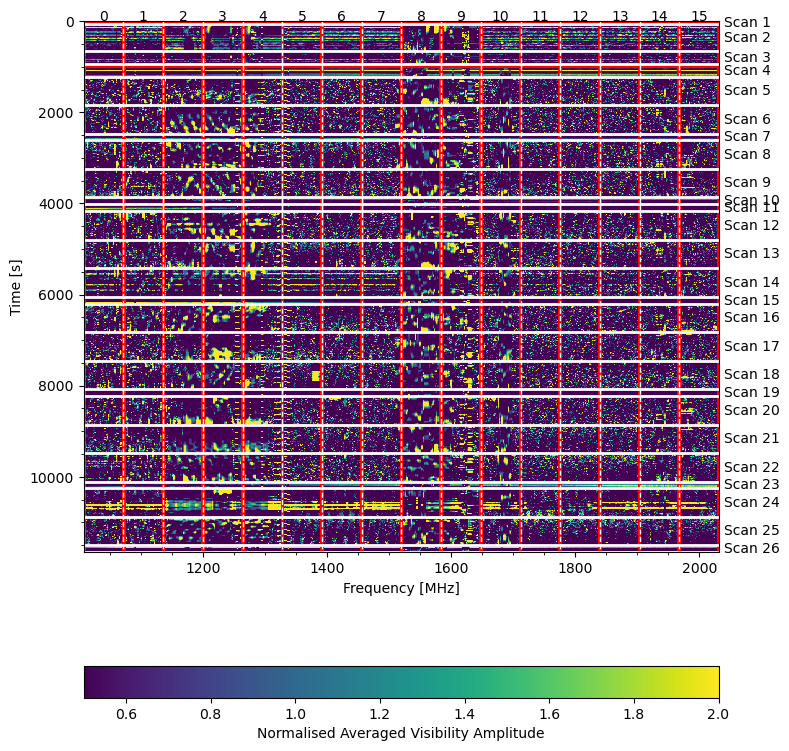

In [10]:
fig, ax = plt.subplots(figsize=(8, 8))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=0.5, vmax=2, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", label="Normalised Averaged Visibility Amplitude")
plt.tight_layout()
plt.show()

In [11]:
def plot_wf_spw(i):
    inspect.plot_wf_spw(freq_array, z_score, i, 2, ntimes, plot_masked=True)
    
interact(plot_wf_spw, i=(0, 15))

interactive(children=(IntSlider(value=7, description='i', max=15), Output()), _dom_classes=('widget-interact',…

<function __main__.plot_wf_spw(i)>

In [12]:
summary_before = np.load(root + "/output/manual_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + "/output/manual_flags_summary_after.npy", allow_pickle='TRUE').item()
        
print("Flag occupancy (percent) before and after manual flags:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after manual flags:

field 3C286
Before: 67.0214, After: 67.0214

field J1058+0133
Before: 64.2414, After: 64.2414

field J1150-0023
Before: 60.0427, After: 60.0427

field QSO J1030+0524
Before: 56.0442, After: 56.0442

field QSO J1036-0232
Before: 55.8676, After: 55.8676

field QSO J1048-0109
Before: 55.1650, After: 55.1650

field QSO J1120+0641
Before: 56.4837, After: 56.4837

field QSO J1137+0045
Before: 56.0442, After: 56.0442

field QSO J1148+0702
Before: 57.2605, After: 57.2605

field QSO J1152+0055
Before: 54.8520, After: 54.8520

field QSO J1201+0133
Before: 55.1650, After: 55.1650

field QSO J1205-0000
Before: 55.4581, After: 55.4581

field QSO J1207+0630
Before: 56.3372, After: 56.3372

field QSO J1207-0005
Before: 56.0381, After: 56.0381

field QSO J1208-0200
Before: 55.4539, After: 55.4539

field QSO J1212+0505
Before: 60.0002, After: 60.0002

field QSO J1217+0131
Before: 55.1650, After: 55.1650

field QSO J1231+0052
Before: 54.7477, Afte

## Flux Calibrator Model
Print model flux densities and plot model amplitude vs. uv-distance. If the calibrator is not resolved, its amplitude should be constant across different uv-distances. If it is slightly resolved, the amplitude will decrease as a function of uv-distance.

In [13]:
setjy = np.load(root + "/output/setjy.npy", allow_pickle='TRUE').item()

print("model flux densities in Jy\n")

for spw in range(16):
    print("SPW {:2d}: I: {:.2f}, U: {:.2f}, V: {:.2f}, Q: {:.2f}".format(spw, *setjy["0"][str(spw)]["fluxd"]))

model flux densities in Jy

SPW  0: I: 17.64, U: 0.00, V: 0.00, Q: 0.00
SPW  1: I: 17.15, U: 0.00, V: 0.00, Q: 0.00
SPW  2: I: 16.70, U: 0.00, V: 0.00, Q: 0.00
SPW  3: I: 16.27, U: 0.00, V: 0.00, Q: 0.00
SPW  4: I: 15.86, U: 0.00, V: 0.00, Q: 0.00
SPW  5: I: 15.49, U: 0.00, V: 0.00, Q: 0.00
SPW  6: I: 15.13, U: 0.00, V: 0.00, Q: 0.00
SPW  7: I: 14.79, U: 0.00, V: 0.00, Q: 0.00
SPW  8: I: 14.47, U: 0.00, V: 0.00, Q: 0.00
SPW  9: I: 14.16, U: 0.00, V: 0.00, Q: 0.00
SPW 10: I: 13.87, U: 0.00, V: 0.00, Q: 0.00
SPW 11: I: 13.60, U: 0.00, V: 0.00, Q: 0.00
SPW 12: I: 13.34, U: 0.00, V: 0.00, Q: 0.00
SPW 13: I: 13.09, U: 0.00, V: 0.00, Q: 0.00
SPW 14: I: 12.85, U: 0.00, V: 0.00, Q: 0.00
SPW 15: I: 12.62, U: 0.00, V: 0.00, Q: 0.00


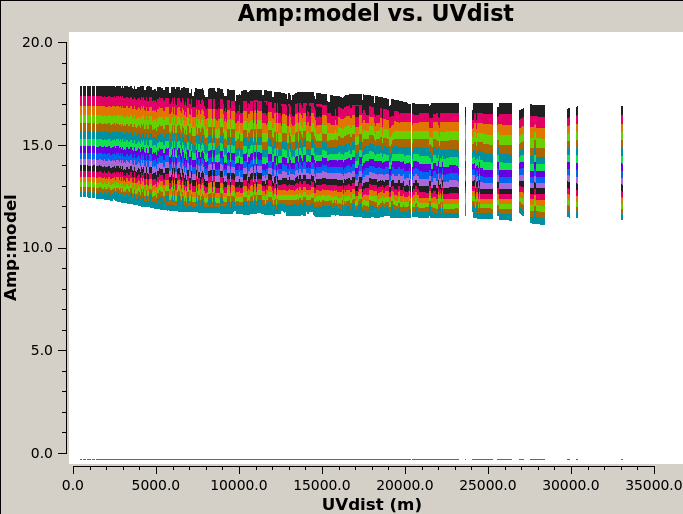

In [14]:
Image(filename=root + "/plots/calplots/setjy_model_amp_vs_uvdist.png")

## Prior Calibration

The prior calibration includes atmospheric opacity corrections, antenna offset corrections and requantizer (rq) gains. These are independent of calibrator observations and use external data instead.

### Weather
Plot weather data and print opacities. For frequencies below 10 GHz the opacity is negligibly small.  

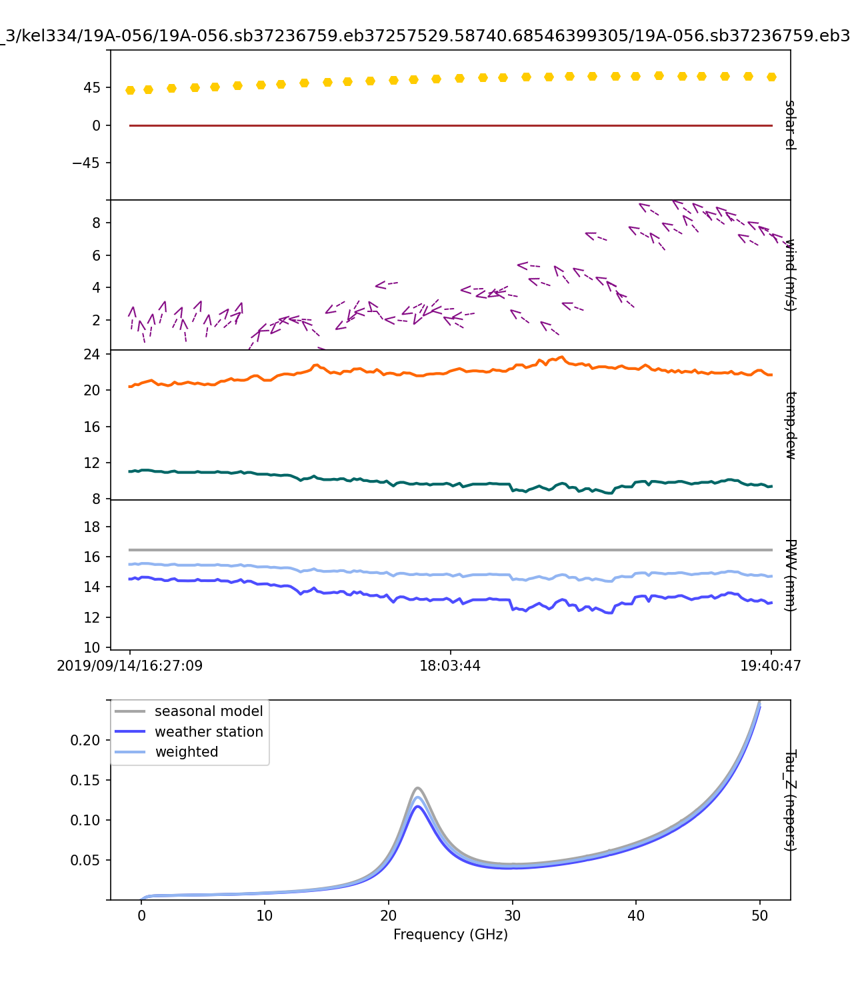

In [15]:
Image(filename=root + "/plots/calplots/weather.png")

In [16]:
opacities = np.load(root + "/output/weather.npy")

print("Opacities [Nepers]\n")

for spw, opacity in enumerate(opacities):
    print(f"SPW {spw}: {opacity}")

Opacities [Nepers]

SPW 0: 0.0051558681886487165
SPW 1: 0.00521599875666374
SPW 2: 0.005268348260508952
SPW 3: 0.005314141563968877
SPW 4: 0.005354816989801879
SPW 5: 0.005390971590338241
SPW 6: 0.005423537051407564
SPW 7: 0.005452987907964683
SPW 8: 0.005479853792855866
SPW 9: 0.005504541698140565
SPW 10: 0.0055273419837946446
SPW 11: 0.005548601845096454
SPW 12: 0.005568469820525496
SPW 13: 0.005587225672263179
SPW 14: 0.005604979975548131
SPW 15: 0.005621911437673304


## Plot Calibration Channels
These are the channels that have been selected for the gain calibration. They should be clean and should not exhibit any amplitude jumps.

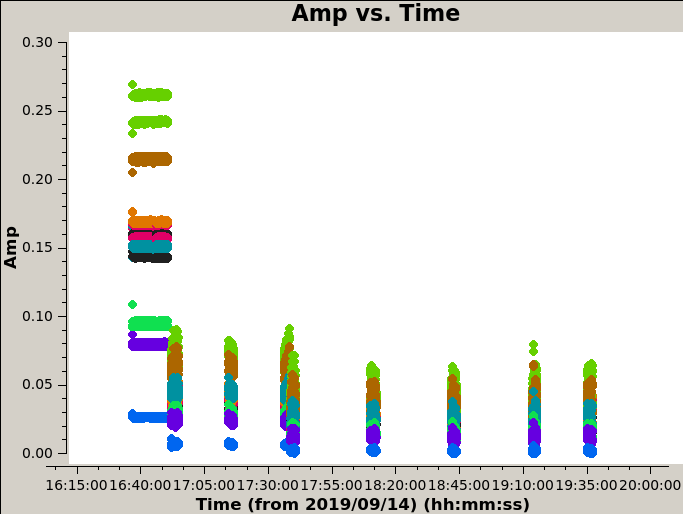

In [17]:
Image(filename=root + "/plots/dataplots/single_chans_amp_vs_time.png")

## Initial Calibration
The initial calibration is done to enable subsequent flagging with automated flagging routines such as CASA's RFlag. The calibration consists of an initial gain phase calibration, a delay calibration, an initial gain phase and amplitude calibration and a bandpass calibration. The two gain calibrations are used for the delay and bandpass calibrations, but are not applied to the data. The gain calibrations are done with a single channel per spectral window.

In [18]:
def plot_two_cols(im1, im2):
    """ 
    Plot two image side by side. E.g phase and amplitude.
    """
    fix, ax = plt.subplots(1, 2, figsize=(15, 5))

    if os.path.exists(im1):
        img_1 = mpimg.imread(im1)
        ax[0].imshow(img_1)

    if os.path.exists(im2):
        img_2 = mpimg.imread(im2)
        ax[1].imshow(img_2)

### Specify Gain Tables

In [19]:
# specify calibration table names
rnd = 0
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration
This is an initial per-integration phase calibration and is done to avoid decorrelation under temporal averaging in the subsequent delay calibration. The gain phase should be stable in time. Antennas or spectral windows that have gain phase discontinuities should be flagged. If all but the reference antenna exhibit phase jumps, a difference reference antenna should be chosen.

In [20]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration
The delay calibration is done by fitting for the phase slopes across frequency with respect to the reference antenna. The first and last 15 channels of the spectral windows are not used in this step, since they have lower gains. The delays should lie between -5 and 5 ns, and anything outside that range should be treated with suspicion.

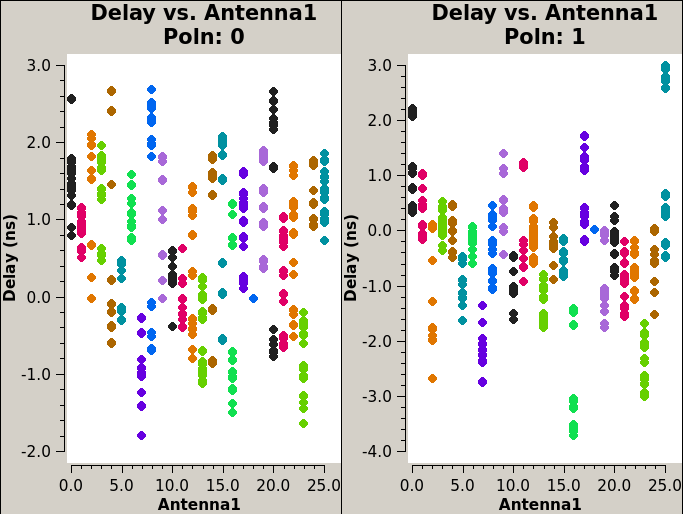

In [21]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration
Similarly to above, we perform an initial gain calibration for the bandpass calibration, but this time we also solve for the amplitudes. The phases and amplitudes should be constant with time and discontinuous solutions should be flagged.

In [22]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration
The amplitudes and phases of the bandpass calibration should be close to 1 and zero respectively after the initial gain calibration. Discontinuities should be flagged.

In [23]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [24]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Plot Corrected Data
This data is averaged in time and colorised by antenna.

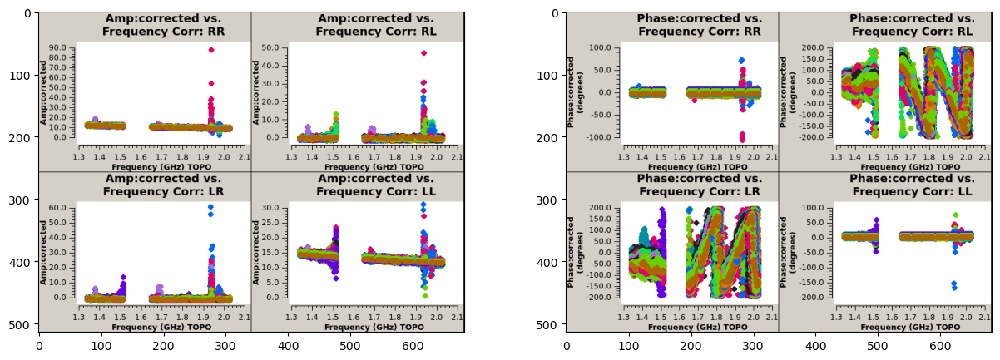

In [25]:
plot_two_cols(
    root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_CorrRR,RL,LR,LL.png",
    root + f"/plots/dataplots/fluxcal_initcal_round_0_phase_vs_freq_CorrRR,RL,LR,LL.png"
)

#### Plot Averaged Corrected Data
Iterate through spectral windows to identify RFI and flag bad channels manually below.

In [26]:
def plot_corrected_spw(spw):
    img = mpimg.imread(root + f"/plots/dataplots/fluxcal_initcal_round_0_amp_vs_freq_avg_spw_{spw}_CorrRR,RL,LR,LL.png")
    plt.imshow(img)

interact(plot_corrected_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_corrected_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [27]:
rnd=0
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 0:

field 3C286
Before: 18.9591, After: 67.0214

antenna ea01
Before: 17.8292, After: 62.0301

antenna ea02
Before: 17.8335, After: 62.0301

antenna ea03
Before: 17.9361, After: 70.4622

antenna ea04
Before: 17.8292, After: 62.0301

antenna ea05
Before: 17.9361, After: 70.4622

antenna ea06
Before: 17.9405, After: 70.4622

antenna ea07
Before: 17.9361, After: 70.4622

antenna ea08
Before: 17.9361, After: 70.4622

antenna ea09
Before: 17.8292, After: 62.0301

antenna ea10
Before: 17.9405, After: 70.4622

antenna ea11
Before: 17.9361, After: 70.4622

antenna ea12
Before: 17.9361, After: 70.4622

antenna ea13
Before: 17.8292, After: 62.0301

antenna ea14
Before: 17.8335, After: 62.0301

antenna ea15
Before: 17.9361, After: 70.4622

antenna ea16
Before: 22.7894, After: 73.6941

antenna ea17
Before: 17.8292, After: 62.0301

antenna ea18
Before: 18.2389, After: 62.4355

antenna ea19
Before: 17.8292, After: 62.0301

antenna e

## First Round of Flagging on Primary Calibrator
The first round of flagging is performed on the primary calibrator only. The flagging routine runs RFlag with timedevscale=5.0, freqdevscale=5.0 and freqfit=line on a ABS_RL, ABS_LR, ABS_LL, ABS_RR, REAL_LL, REAL_RR, IMAG_LL and IMAG_RR, where for the real and imaginary parts RFLag is performed on the residual (corrected-model) data. TFCrop is run with timecutoff=4.0 and freqcutoff=4.0 on ABS_RL, ABS_LR, ABS_LL and ABS_RR. Flags are extended across polarisations. The plots below show the amplitudes and phases of the calibrators before and after flagging respectively.

### Before Flagging

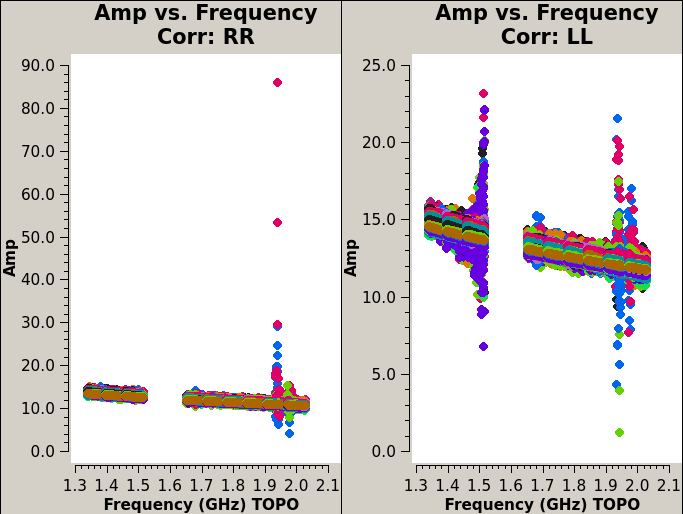

In [28]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

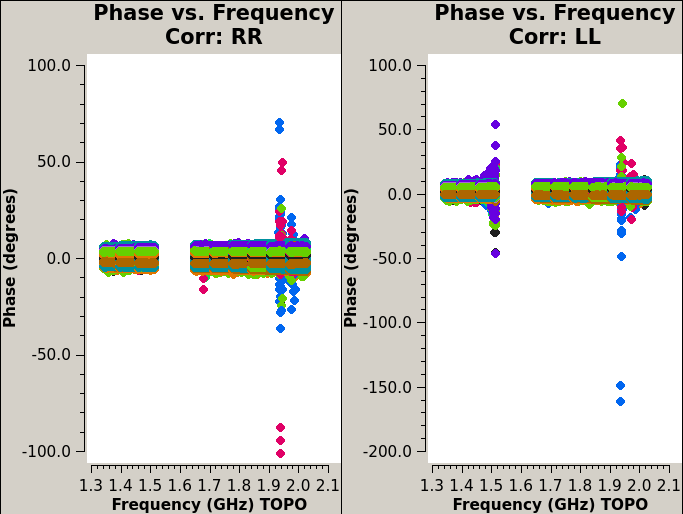

In [29]:
Image(filename=root + "/plots/dataplots/before_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

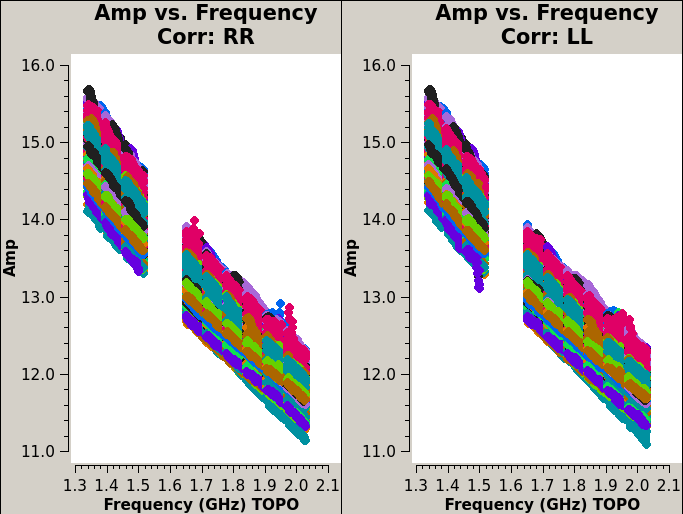

In [30]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

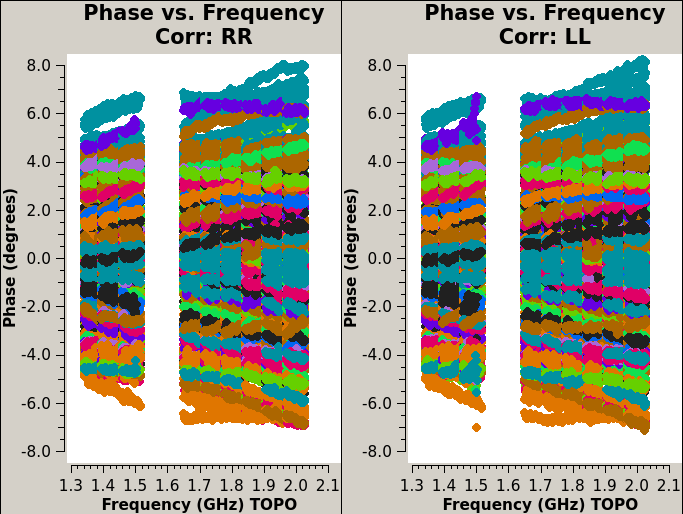

In [31]:
Image(filename=root + "/plots/dataplots/after_fluxcal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Summary

In [32]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C286
Before: 67.0214, After: 67.3048

antenna ea01
Before: 62.0301, After: 62.1918

antenna ea02
Before: 62.0301, After: 62.1721

antenna ea03
Before: 70.4622, After: 70.5222

antenna ea04
Before: 62.0301, After: 62.1590

antenna ea05
Before: 70.4622, After: 70.6671

antenna ea06
Before: 70.4622, After: 70.5337

antenna ea07
Before: 70.4622, After: 70.7128

antenna ea08
Before: 70.4622, After: 70.5849

antenna ea09
Before: 62.0301, After: 62.5077

antenna ea10
Before: 70.4622, After: 70.7200

antenna ea11
Before: 70.4622, After: 70.5362

antenna ea12
Before: 70.4622, After: 70.7299

antenna ea13
Before: 62.0301, After: 62.1680

antenna ea14
Before: 62.0301, After: 62.1990

antenna ea15
Before: 70.4622, After: 70.5093

antenna ea16
Before: 73.6941, After: 73.8484

antenna ea17
Before: 62.0301, After: 62.1738

antenna ea18
Before: 62.4355, After: 64.4121

antenna ea19
Before: 62.0301, After: 62.4552

antenna 

## Semi-Final Calibration
The steps from the intitial calibration are repeated. 

### Specify Gain Tables

In [33]:
# specify calibration table names
rnd = 1
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

### Delay Initial Gain Calibration

In [34]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

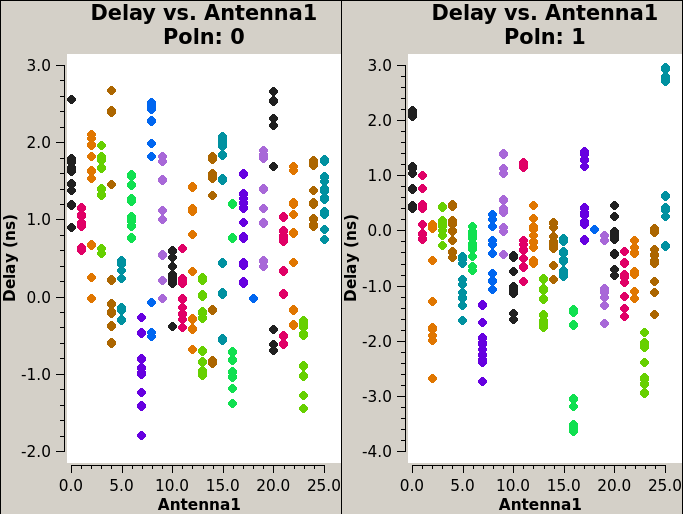

In [35]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [36]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [37]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [38]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flagging Summary
If no calibration solutions are available, data may be flagged (e.g. bad spectral windows).

In [39]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after initial calibration round {rnd}:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after initial calibration round 1:

field 3C286
Before: 67.3048, After: 67.3049

antenna ea01
Before: 62.1918, After: 62.1922

antenna ea02
Before: 62.1721, After: 62.1721

antenna ea03
Before: 70.5222, After: 70.5222

antenna ea04
Before: 62.1590, After: 62.1590

antenna ea05
Before: 70.6671, After: 70.6671

antenna ea06
Before: 70.5337, After: 70.5337

antenna ea07
Before: 70.7128, After: 70.7132

antenna ea08
Before: 70.5849, After: 70.5849

antenna ea09
Before: 62.5077, After: 62.5077

antenna ea10
Before: 70.7200, After: 70.7200

antenna ea11
Before: 70.5362, After: 70.5362

antenna ea12
Before: 70.7299, After: 70.7299

antenna ea13
Before: 62.1680, After: 62.1680

antenna ea14
Before: 62.1990, After: 62.1990

antenna ea15
Before: 70.5093, After: 70.5097

antenna ea16
Before: 73.8484, After: 73.8488

antenna ea17
Before: 62.1738, After: 62.1738

antenna ea18
Before: 64.4121, After: 64.4135

antenna ea19
Before: 62.4552, After: 62.4552

antenna e

## Second Round of Flagging
The flagging is repeated, but this time on all calibrators.

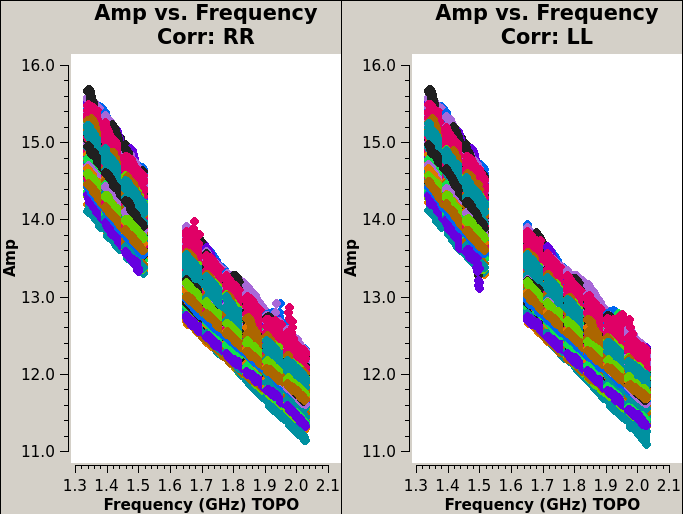

In [40]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

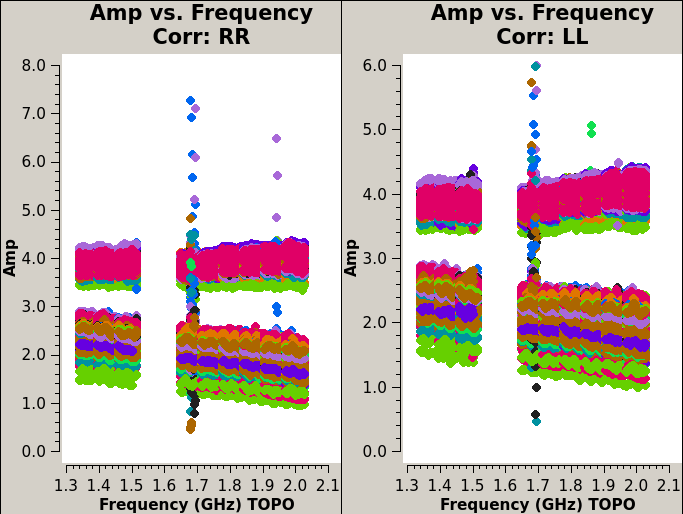

In [41]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

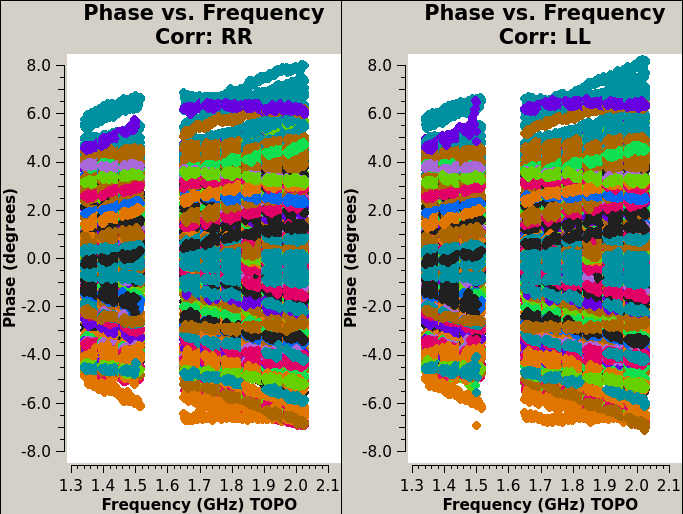

In [42]:
# primary calibrator
Image(filename=root + "/plots/dataplots/before_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

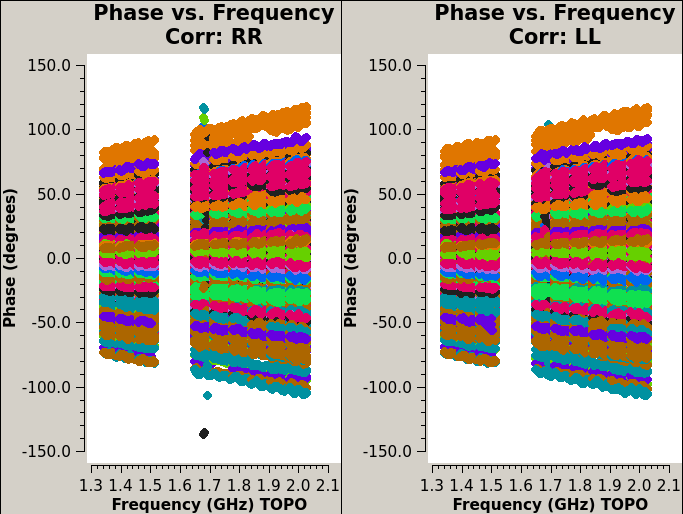

In [43]:
# phase calibrators
Image(filename=root + "/plots/dataplots/before_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### After Flagging

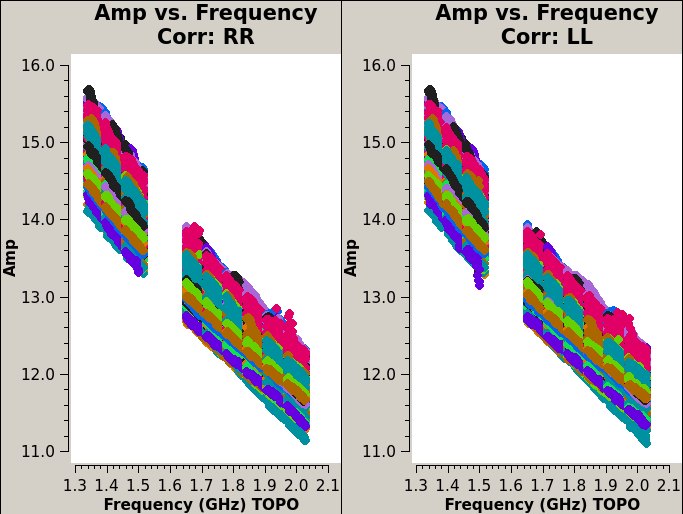

In [44]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_amp_vs_freq_CorrRR,LL.png")

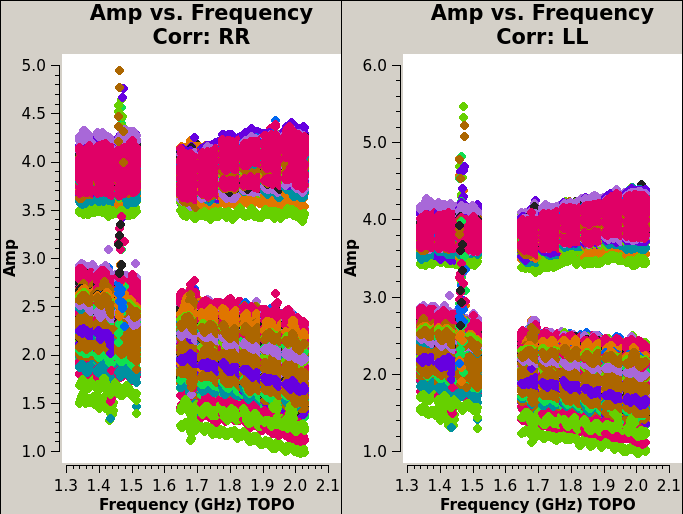

In [45]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

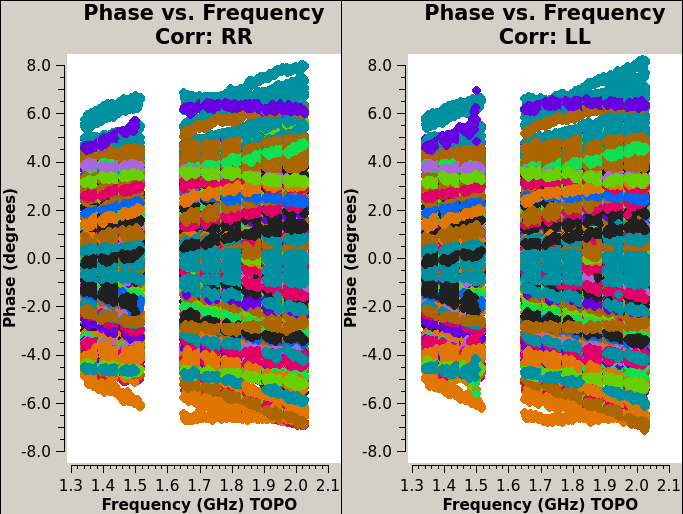

In [46]:
# primary calibrator
Image(filename=root + "/plots/dataplots/after_fluxcal_round_1_flagging_phase_vs_freq_CorrRR,LL.png")

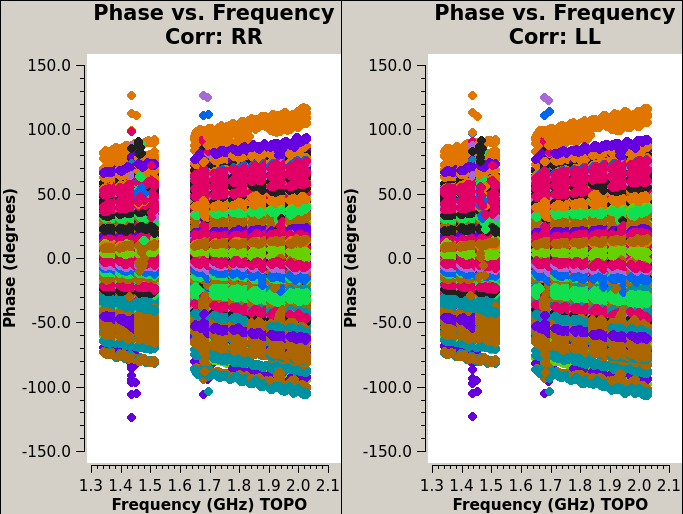

In [47]:
# phase calibrators
Image(filename=root + "/plots/dataplots/after_phasecal_round_0_flagging_phase_vs_freq_CorrRR,LL.png")

### Flagging Summary

In [48]:
summary_before = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/fluxcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the flux calibrator:

field 3C286
Before: 67.3049, After: 67.3593

scan 1
Before: 100.0000, After: 100.0000

scan 2
Before: 70.1556, After: 70.2053

scan 3
Before: 55.3796, After: 55.4536

antenna ea01
Before: 62.1922, After: 62.2476

antenna ea02
Before: 62.1721, After: 62.2058

antenna ea03
Before: 70.5222, After: 70.5466

antenna ea04
Before: 62.1590, After: 62.1848

antenna ea05
Before: 70.6671, After: 70.7313

antenna ea06
Before: 70.5337, After: 70.5811

antenna ea07
Before: 70.7132, After: 70.7664

antenna ea08
Before: 70.5849, After: 70.6321

antenna ea09
Before: 62.5077, After: 62.6099

antenna ea10
Before: 70.7200, After: 70.7814

antenna ea11
Before: 70.5362, After: 70.5722

antenna ea12
Before: 70.7299, After: 70.8252

antenna ea13
Before: 62.1680, After: 62.1897

antenna ea14
Before: 62.1990, After: 62.2366

antenna ea15
Before: 70.5097, After: 70.5254

antenna ea16
Before: 73.8488, After: 73.9066

antenna ea17
Before: 62.

In [49]:
summary_before = np.load(root + f"/output/phasecal_round_0_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/phasecal_round_0_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after flagging the phase calibrators:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after flagging the phase calibrators:

field J1058+0133
Before: 64.3120, After: 65.1236

field J1150-0023
Before: 60.1216, After: 61.1247

scan 10
Before: 60.3626, After: 61.4570

scan 11
Before: 61.4904, After: 62.3577

scan 15
Before: 56.0854, After: 57.0847

scan 19
Before: 57.5045, After: 58.6976

scan 23
Before: 64.8766, After: 65.9387

scan 26
Before: 60.5234, After: 61.4284

scan 4
Before: 69.1466, After: 69.8448

scan 7
Before: 59.5069, After: 60.2411

antenna ea01
Before: 60.1414, After: 60.7691

antenna ea02
Before: 60.5050, After: 61.0452

antenna ea03
Before: 60.1909, After: 60.5860

antenna ea04
Before: 60.1209, After: 61.1112

antenna ea05
Before: 60.5050, After: 60.9425

antenna ea06
Before: 60.3128, After: 61.1412

antenna ea07
Before: 60.1414, After: 60.6198

antenna ea08
Before: 60.1616, After: 60.9064

antenna ea09
Before: 60.1831, After: 61.4939

antenna ea10
Before: 60.3128, After: 61.5346

antenna ea11
Before: 60.3128, After: 61

## Final Calibration
First, the initial calibration (delay and bandpass) are repeated on the primary calibrator. Then, the final gains of the calibrators are derived.

### Specify Gain Tables

In [50]:
# specify calibration table names
rnd = 2
delay_init_table = f"{name}.p.G{rnd}"
delay_table = f"{name}.K{rnd}"
bandpass_init_table = f"{name}.ap.G{rnd}"
bandpass_table = f"{name}.B{rnd}"

fluxcal_phase_table = f"{name}_fluxcal_phase.Gfinal"
short_gain_table = f"{name}_short.Gfinal"
amp_gain_table = f"{name}_amp.Gfinal"
phase_gain_table = f"{name}_phase.Gfinal"

### Delay Initial Gain Calibration

In [51]:
def plot_delay_init_cal(ant):
    img = mpimg.imread(root + f"/plots/calplots/{delay_init_table}_ant_{ant}_Poln0,1.png")
    imgplot = plt.imshow(img)

interact(plot_delay_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_delay_init_cal(ant)>

### Delay Calibration

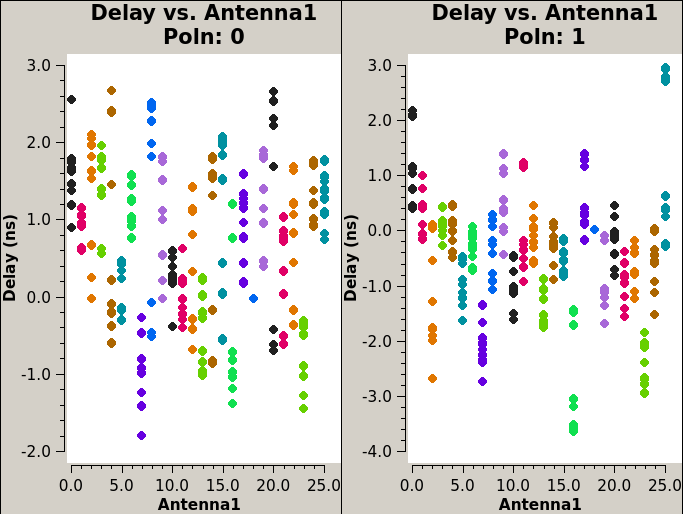

In [52]:
Image(filename=root + f"/plots/calplots/{delay_table}_Poln0,1.png")

### Bandpass Initial Gain Calibration

In [53]:
def plot_bandpass_init_cal(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_init_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_init_table}_phase_ant_{ant}_Poln0,1.png"
    )

interact(plot_bandpass_init_cal, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_init_cal(ant)>

### Bandpass Calibration

In [54]:
def plot_bandpass_ant(ant):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_ant_{ant}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_ant_{ant}_Poln0,1.png"
    )
    
interact(plot_bandpass_ant, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_bandpass_ant(ant)>

Iterate through spectral windows and colorise by antenna. 

In [55]:
def plot_bandpass_spw(spw):
    plot_two_cols(
        root + f"/plots/calplots/{bandpass_table}_amp_spw_{spw}_Poln0,1.png",
        root + f"/plots/calplots/{bandpass_table}_phase_spw_{spw}_Poln0,1.png"
    )

interact(plot_bandpass_spw, spw=(0, conf["spw"]-1))

interactive(children=(IntSlider(value=7, description='spw', max=15), Output()), _dom_classes=('widget-interact…

<function __main__.plot_bandpass_spw(spw)>

### Flux Calibrator Final Gain Phase

In [56]:
def plot_final_fluxcal_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{fluxcal_phase_table}_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_fluxcal_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_fluxcal_phase(ant)>

### Short Interval Gain Calibration
This is an initial calibration done on a per-integration basis on the calibrators.

In [57]:
def plot_final_short_gain_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{short_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_short_gain_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_short_gain_phase(ant)>

### Long Interval Gain Calibration
The gain amplitudes of the calibrators of solved for using the initial gain phase calibration above.

In [58]:
def plot_final_long_gain(ant):
    plot_two_cols(
        root + f'/plots/calplots/{amp_gain_table}_amp_ant_{ant}_Poln0,1.png',
        root + f'/plots/calplots/{amp_gain_table}_phase_ant_{ant}_Poln0,1.png'
    )

interact(plot_final_long_gain, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_long_gain(ant)>

### Phase Calibration
Derive the final gain phases of the calibrators. That of the primary calibrator should be close to zero, since it was already derived and applied earlier on.

In [59]:
def plot_final_phase(ant):
    img = mpimg.imread(root + f'/plots/calplots/{phase_gain_table}_phase_ant_{ant}_Poln0,1.png')
    plt.imshow(img)

interact(plot_final_phase, ant=(0, conf["ants"]-1))

interactive(children=(IntSlider(value=13, description='ant', max=26), Output()), _dom_classes=('widget-interac…

<function __main__.plot_final_phase(ant)>

### Flagging Summary

In [60]:
rnd=1
summary_before = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/initcal_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print(f"Flag occupancy (percent) before and after final delay and bandpass calibration:\n")

print_summary("field")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after final delay and bandpass calibration:

field 3C286
Before: 67.3048, After: 67.3049

antenna ea01
Before: 62.1918, After: 62.1922

antenna ea02
Before: 62.1721, After: 62.1721

antenna ea03
Before: 70.5222, After: 70.5222

antenna ea04
Before: 62.1590, After: 62.1590

antenna ea05
Before: 70.6671, After: 70.6671

antenna ea06
Before: 70.5337, After: 70.5337

antenna ea07
Before: 70.7128, After: 70.7132

antenna ea08
Before: 70.5849, After: 70.5849

antenna ea09
Before: 62.5077, After: 62.5077

antenna ea10
Before: 70.7200, After: 70.7200

antenna ea11
Before: 70.5362, After: 70.5362

antenna ea12
Before: 70.7299, After: 70.7299

antenna ea13
Before: 62.1680, After: 62.1680

antenna ea14
Before: 62.1990, After: 62.1990

antenna ea15
Before: 70.5093, After: 70.5097

antenna ea16
Before: 73.8484, After: 73.8488

antenna ea17
Before: 62.1738, After: 62.1738

antenna ea18
Before: 64.4121, After: 64.4135

antenna ea19
Before: 62.4552, After: 62.4552



In [61]:
summary_before = np.load(root + f"/output/applycal_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/applycal_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) before and after applying final calibration:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) before and after applying final calibration:

field 3C286
Before: 67.3595, After: 67.3987

field J1058+0133
Before: 65.1236, After: 65.1237

field J1150-0023
Before: 61.1247, After: 61.1247

field QSO J1030+0524
Before: 56.1375, After: 56.4308

field QSO J1036-0232
Before: 55.9612, After: 56.2556

field QSO J1048-0109
Before: 55.2602, After: 55.5594

field QSO J1120+0641
Before: 56.5761, After: 56.8665

field QSO J1137+0045
Before: 56.1375, After: 56.4308

field QSO J1148+0702
Before: 57.3512, After: 57.6365

field QSO J1152+0055
Before: 54.9478, After: 55.2490

field QSO J1201+0133
Before: 55.2602, After: 55.5594

field QSO J1205-0000
Before: 55.5527, After: 55.8499

field QSO J1207+0630
Before: 56.4299, After: 56.7213

field QSO J1207-0005
Before: 56.1314, After: 56.4248

field QSO J1208-0200
Before: 55.5485, After: 55.8457

field QSO J1212+0505
Before: 60.0851, After: 60.3520

field QSO J1217+0131
Before: 55.2602, After: 55.5594

field QSO J1231+0052
Before:

## Target Flags
Now that the final calibration tables have been derived and applied to the data, the automated flagging routine is run on the target fields.

### Before Flagging

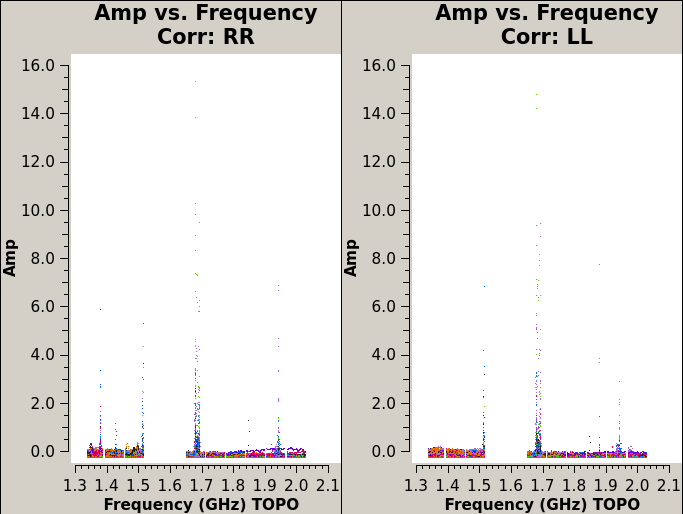

In [62]:
Image(filename=root + "/plots/dataplots/before_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### After Flagging

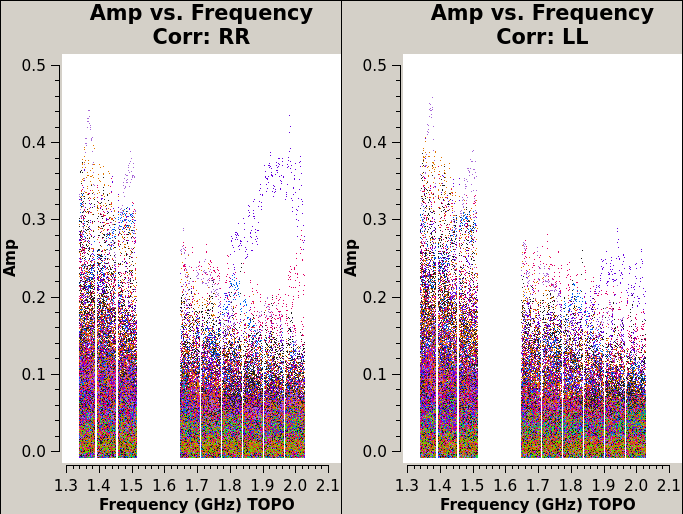

In [63]:
Image(filename=root + "/plots/dataplots/after_targets_round_0_flagging_amp_vs_freq_CorrRR,LL.png")

### Summary

In [64]:
rnd=0
summary_before = np.load(root + f"/output/targets_round_{rnd}_flags_summary_before.npy", allow_pickle='TRUE').item()
summary_after = np.load(root + f"/output/targets_round_{rnd}_flags_summary_after.npy", allow_pickle='TRUE').item()

print("Flag occupancy (percent) after flagging the flux calibrator:\n")

print_summary("field")
print_summary("scan")
print_summary("antenna")
print_summary("spw")

Flag occupancy (percent) after flagging the flux calibrator:

field QSO J1030+0524
Before: 56.4308, After: 57.2138

field QSO J1036-0232
Before: 56.2556, After: 57.0990

field QSO J1048-0109
Before: 55.5594, After: 56.3675

field QSO J1120+0641
Before: 56.8665, After: 57.3133

field QSO J1137+0045
Before: 56.4308, After: 56.9994

field QSO J1148+0702
Before: 57.6365, After: 58.0583

field QSO J1152+0055
Before: 55.2490, After: 55.9631

field QSO J1201+0133
Before: 55.5594, After: 56.2883

field QSO J1205-0000
Before: 55.8499, After: 56.7421

field QSO J1207+0630
Before: 56.7213, After: 57.2906

field QSO J1207-0005
Before: 56.4248, After: 57.4296

field QSO J1208-0200
Before: 55.8457, After: 57.1186

field QSO J1212+0505
Before: 60.3520, After: 61.2493

field QSO J1217+0131
Before: 55.5594, After: 56.3883

field QSO J1231+0052
Before: 55.1458, After: 56.0561

scan 12
Before: 57.6365, After: 58.0583

scan 13
Before: 56.4308, After: 56.9994

scan 14
Before: 55.2490, After: 55.9631

scan 

## Summary Plots
These plots show the corrected amplitudes and phases of all fields as a function of uv-distance and frequency. The values plotted against uv-distance are colorised by spectral window while those plotted against frequency are colorised by antenna number. Remaining RFI should be flagged manually in CASA.

In [65]:
field_dict = vladata.get_field_names(ms)
fields = field_dict["calibrators"] + "," + field_dict["targets"]

3C286


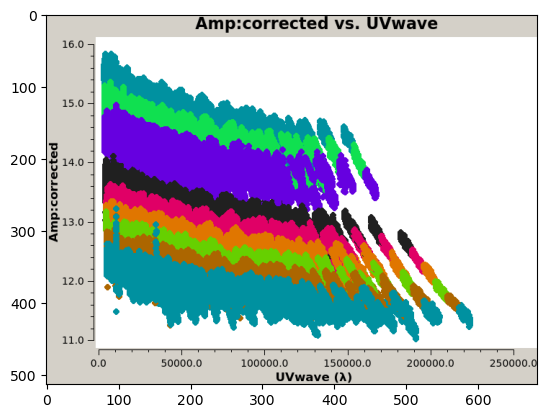

J1058+0133


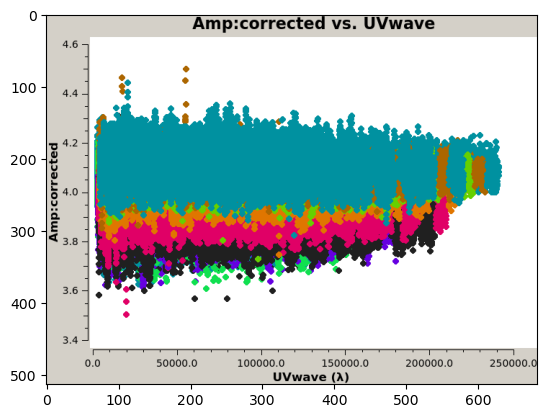

J1150-0023


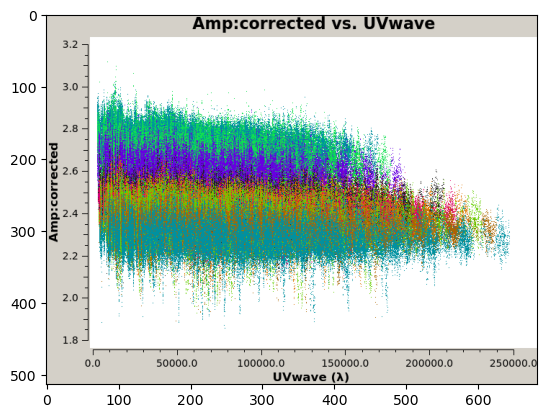

QSO J1030+0524


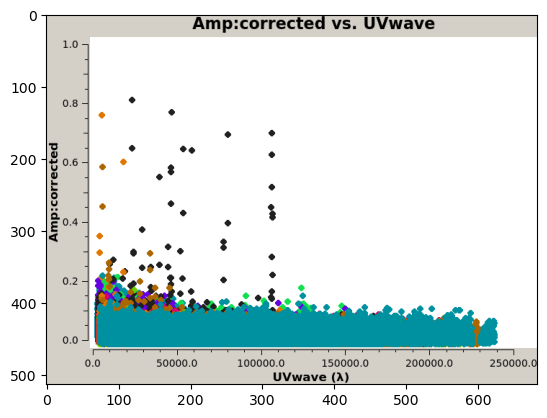

QSO J1036-0232


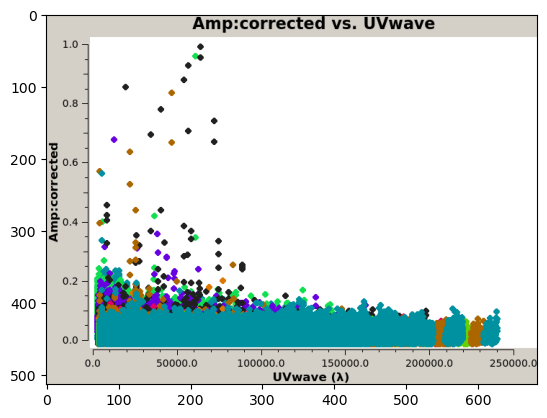

QSO J1048-0109


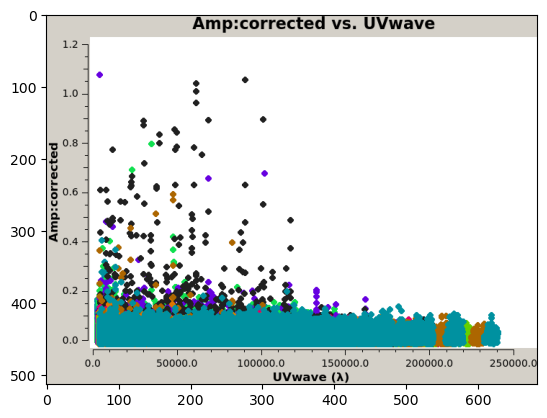

QSO J1120+0641


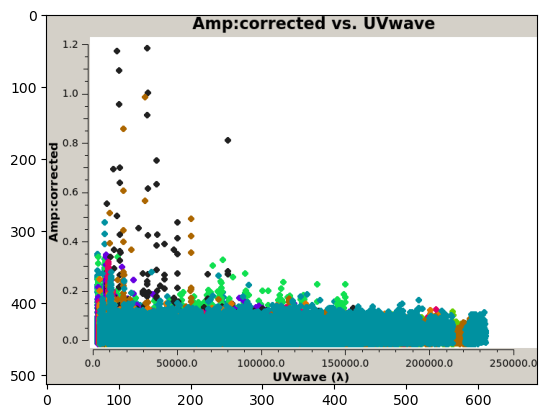

QSO J1148+0702


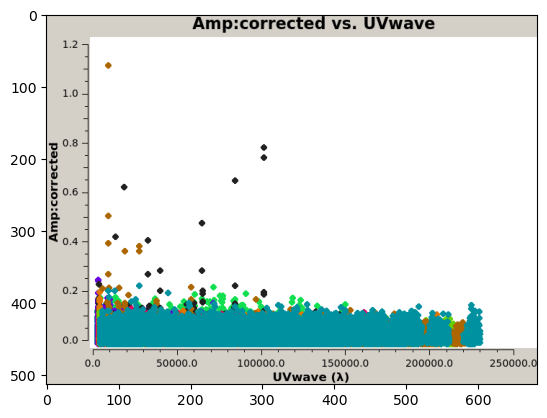

QSO J1137+0045


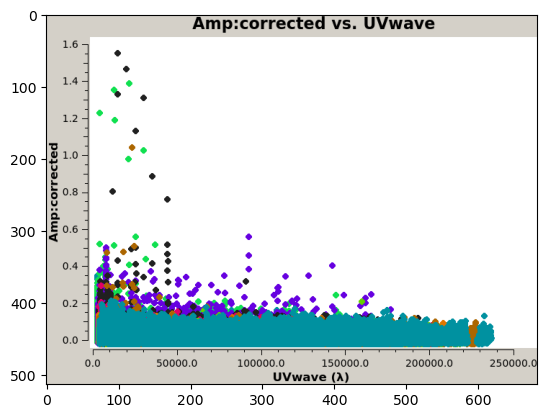

QSO J1152+0055


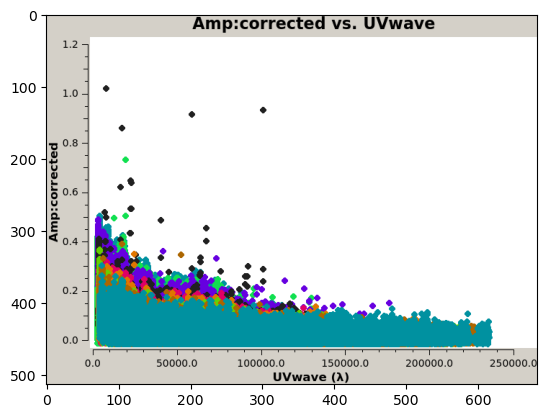

QSO J1201+0133


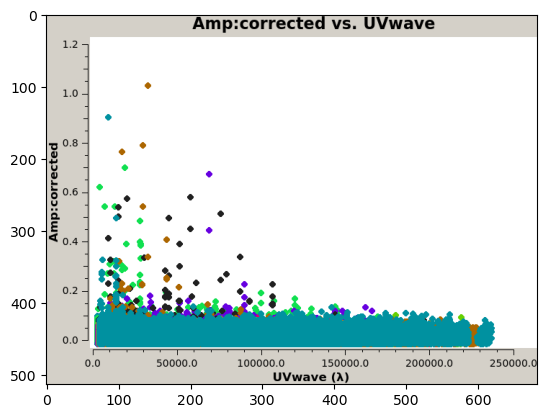

QSO J1205-0000


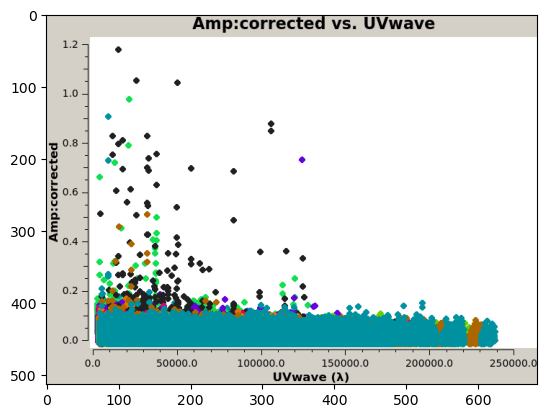

QSO J1207-0005


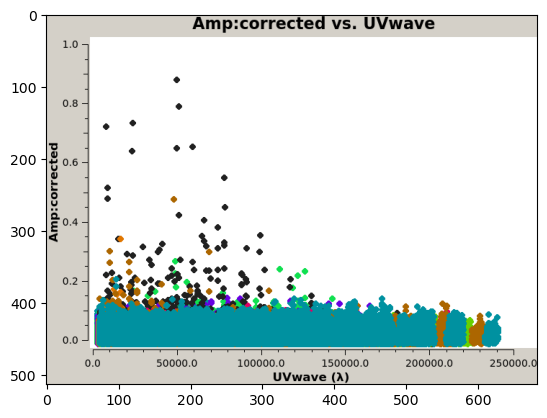

QSO J1208-0200


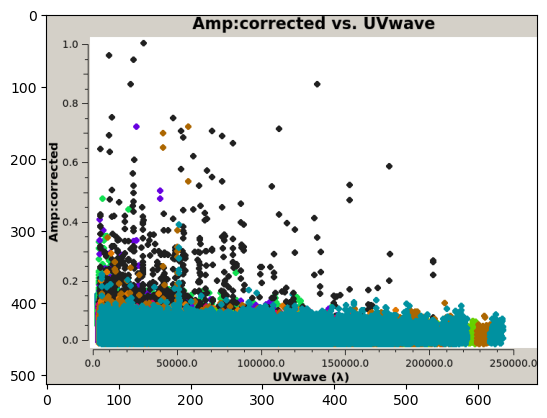

QSO J1217+0131


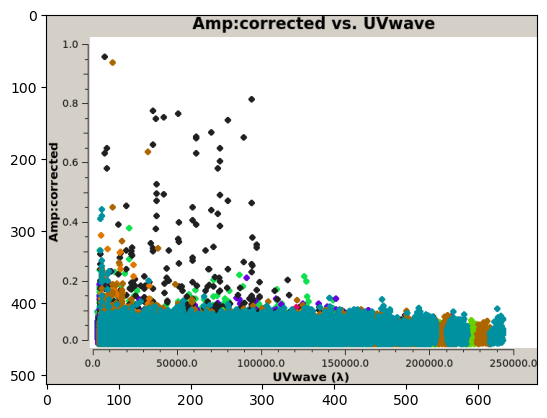

QSO J1231+0052


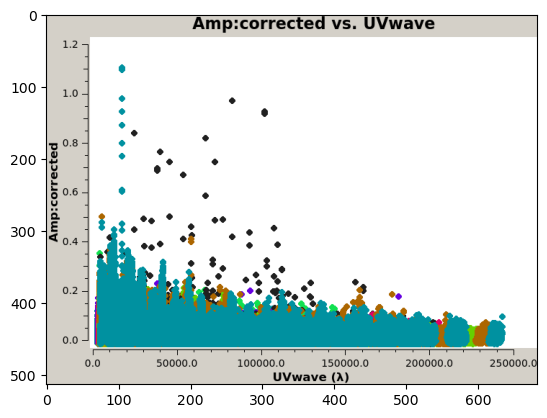

QSO J1212+0505


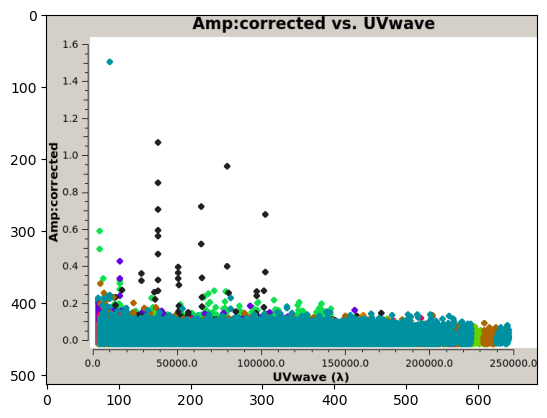

QSO J1207+0630


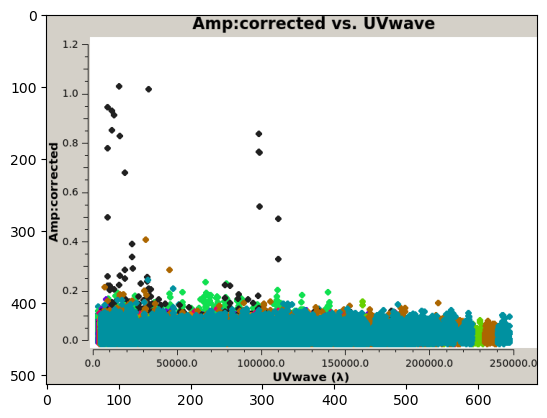

In [66]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_uvdist_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C286


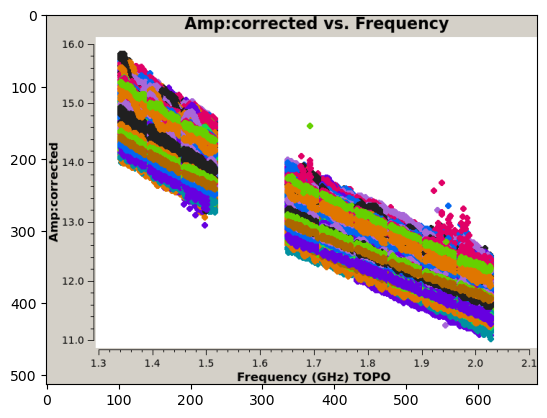

J1058+0133


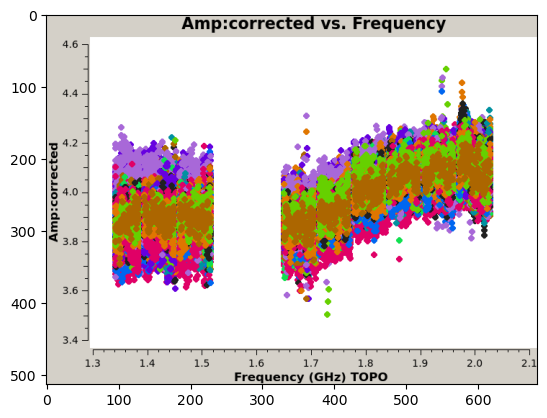

J1150-0023


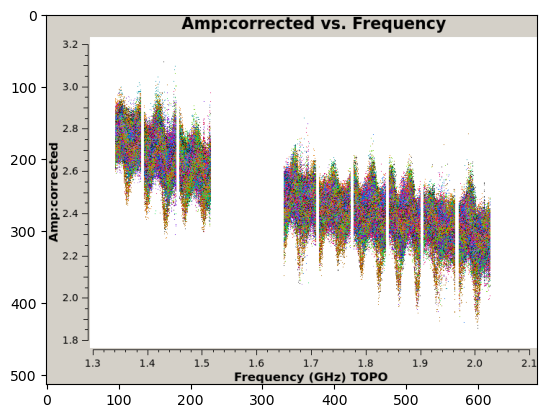

QSO J1030+0524


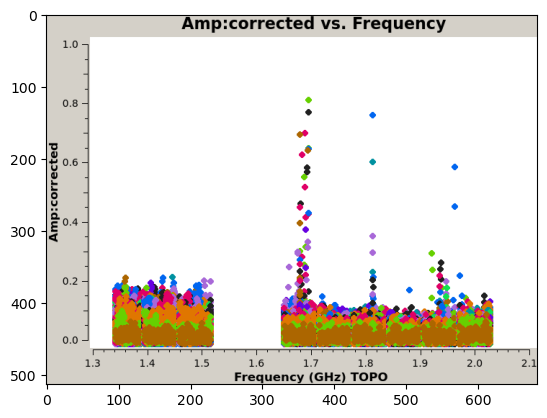

QSO J1036-0232


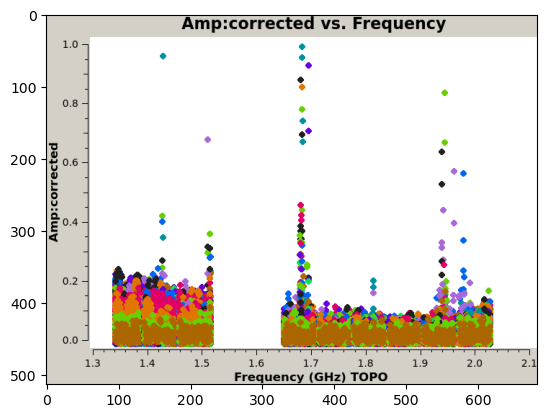

QSO J1048-0109


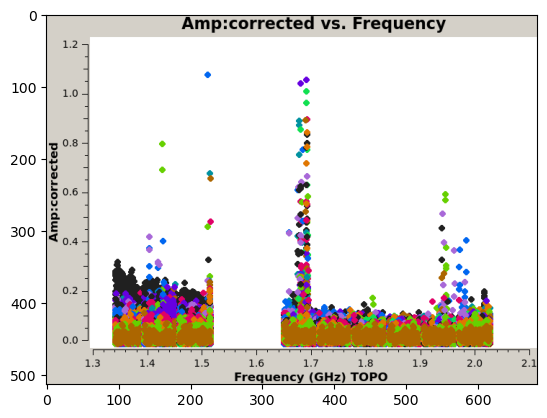

QSO J1120+0641


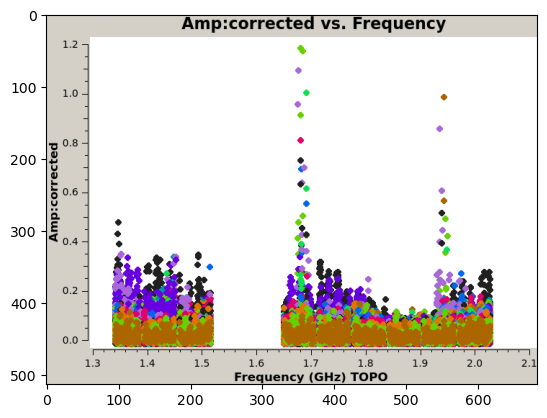

QSO J1148+0702


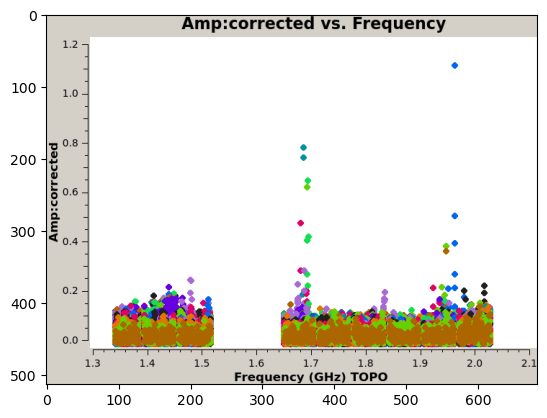

QSO J1137+0045


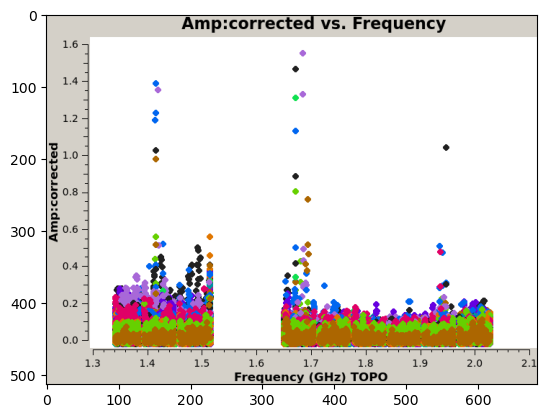

QSO J1152+0055


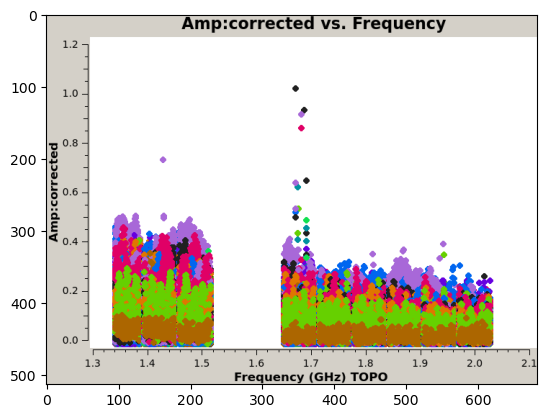

QSO J1201+0133


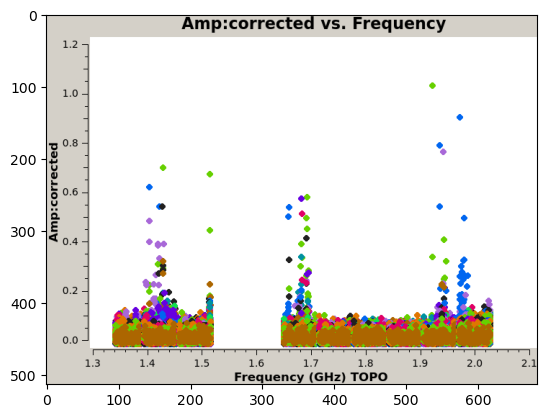

QSO J1205-0000


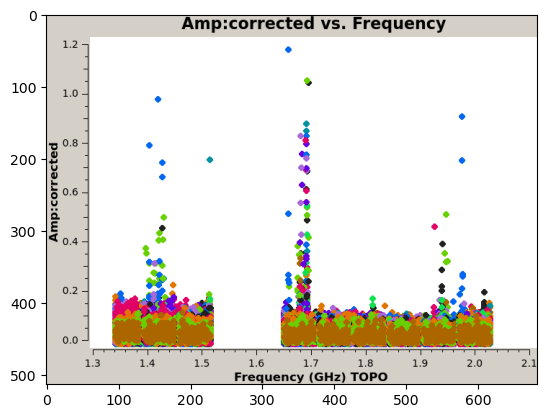

QSO J1207-0005


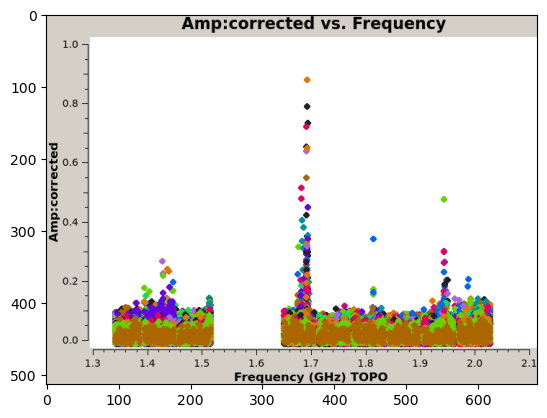

QSO J1208-0200


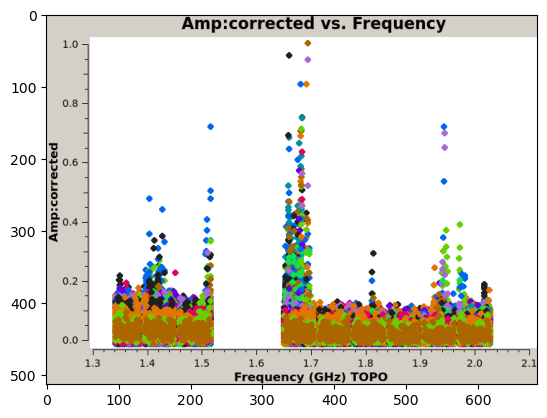

QSO J1217+0131


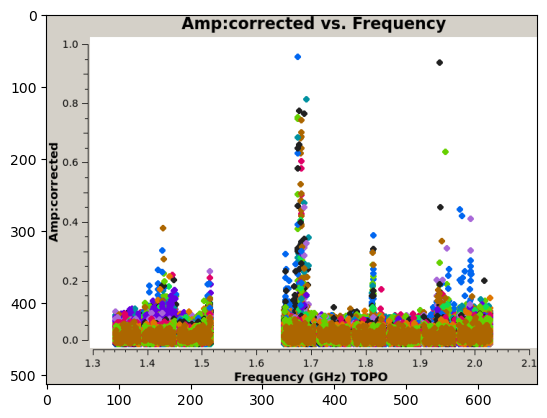

QSO J1231+0052


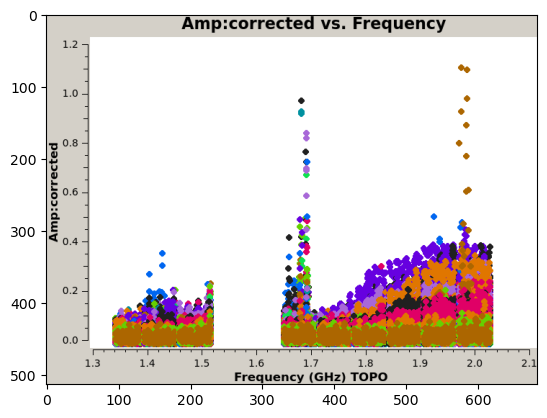

QSO J1212+0505


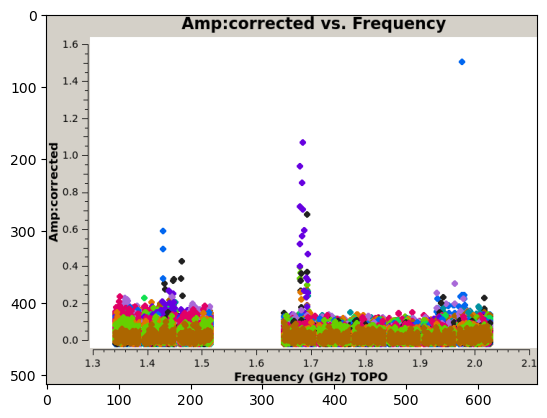

QSO J1207+0630


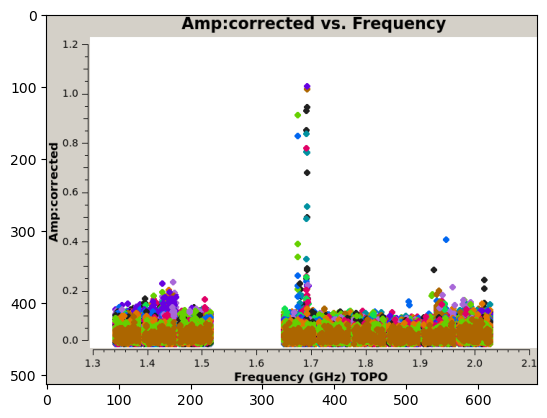

In [67]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_amp_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

3C286


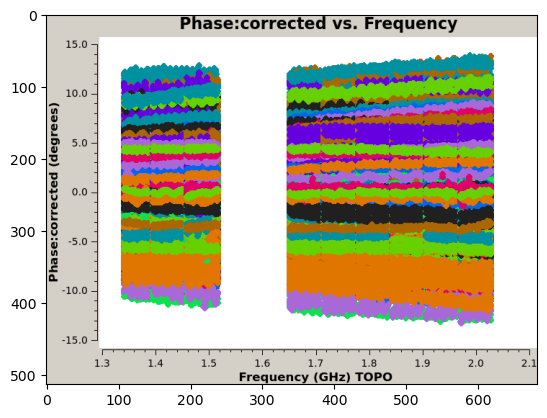

J1058+0133


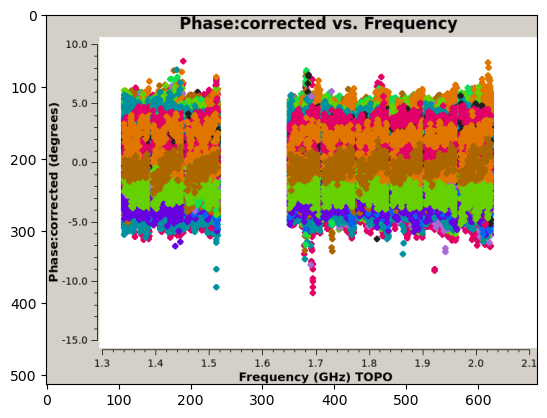

J1150-0023


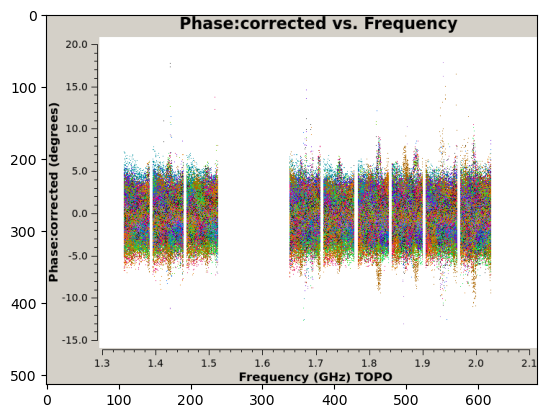

QSO J1030+0524


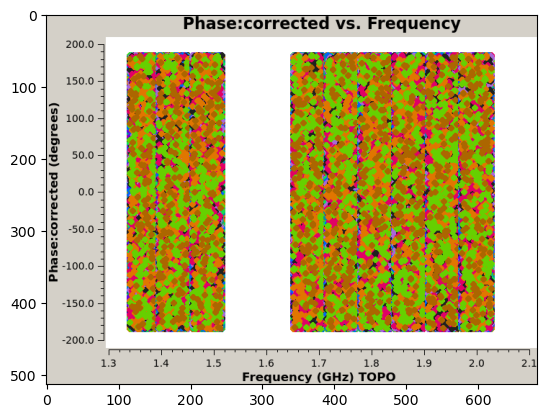

QSO J1036-0232


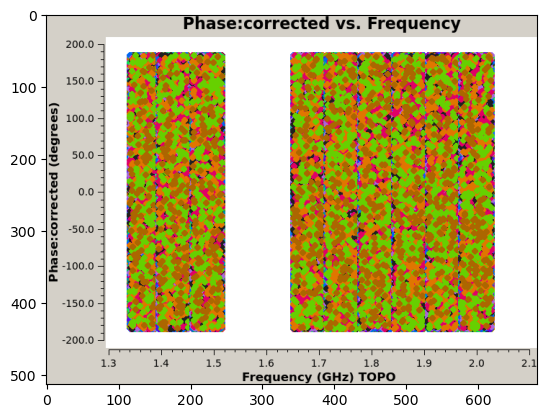

QSO J1048-0109


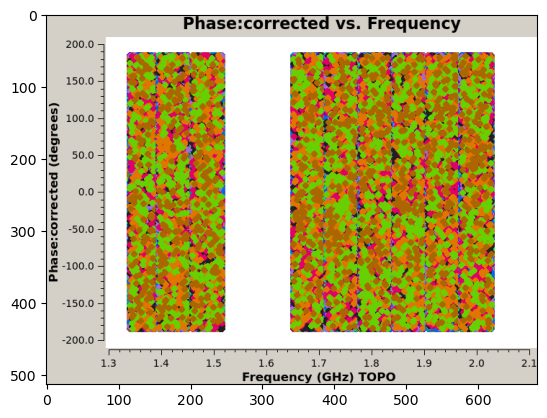

QSO J1120+0641


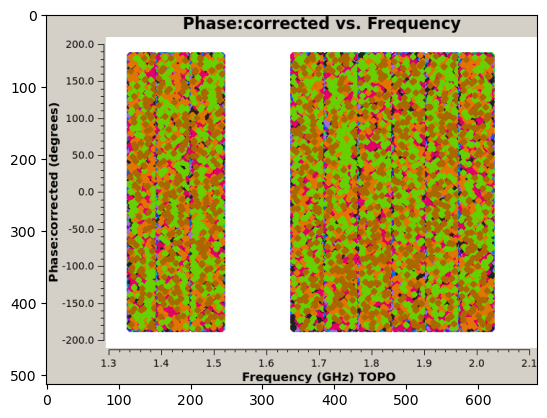

QSO J1148+0702


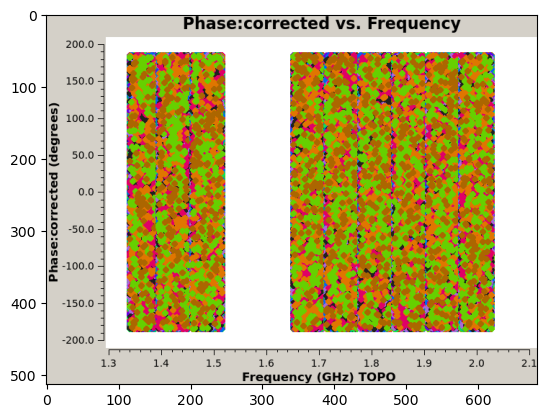

QSO J1137+0045


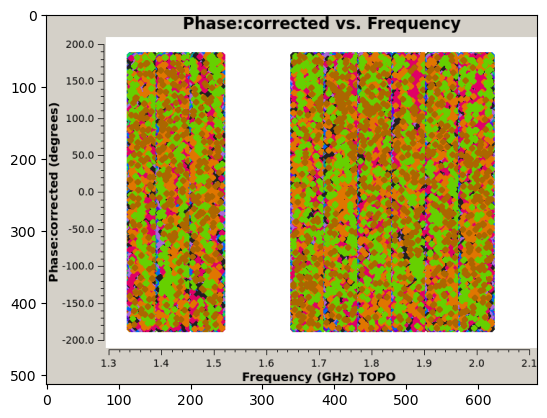

QSO J1152+0055


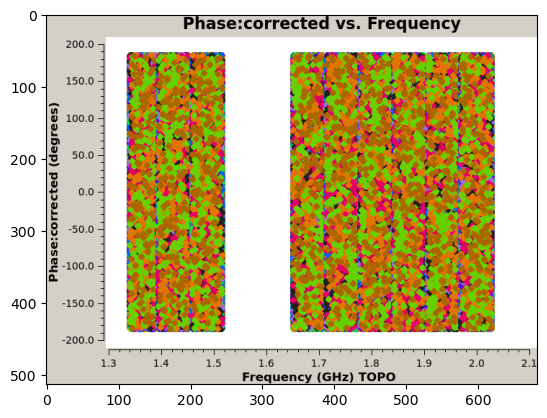

QSO J1201+0133


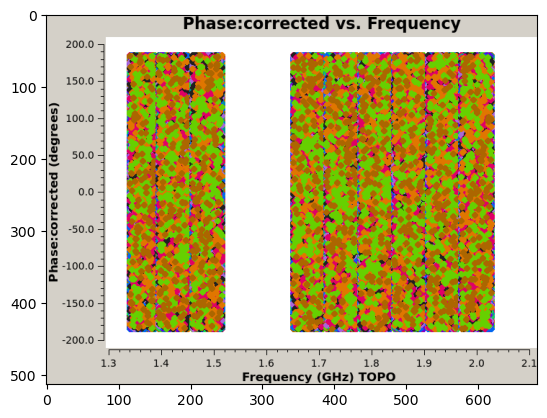

QSO J1205-0000


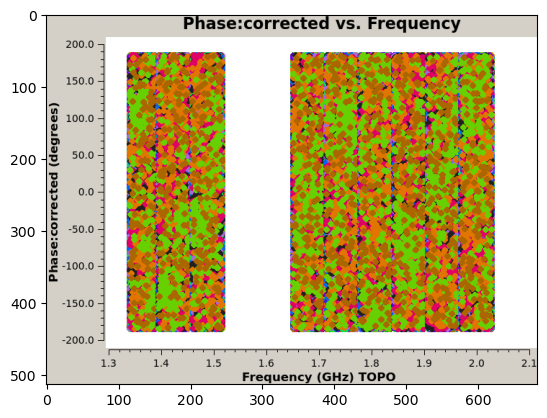

QSO J1207-0005


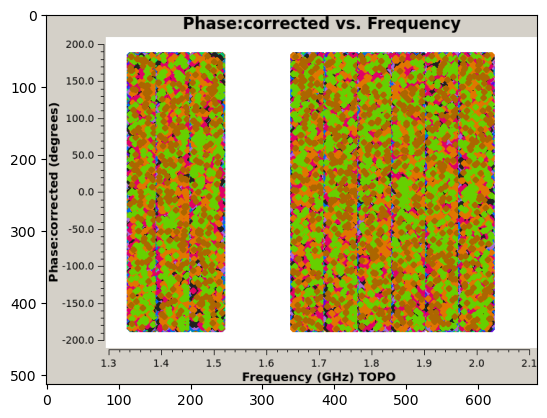

QSO J1208-0200


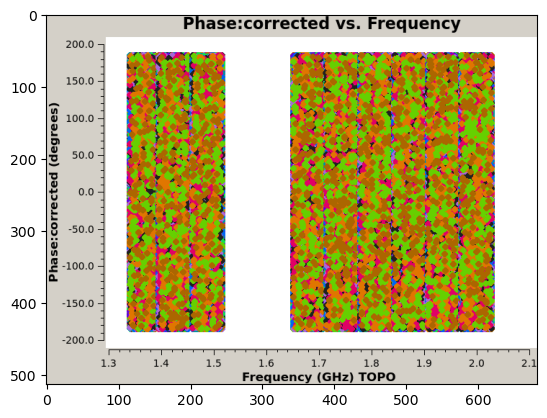

QSO J1217+0131


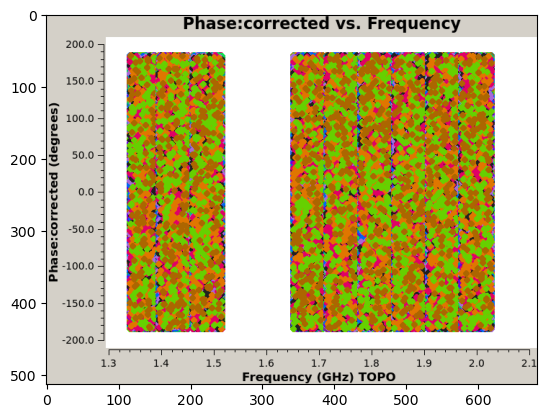

QSO J1231+0052


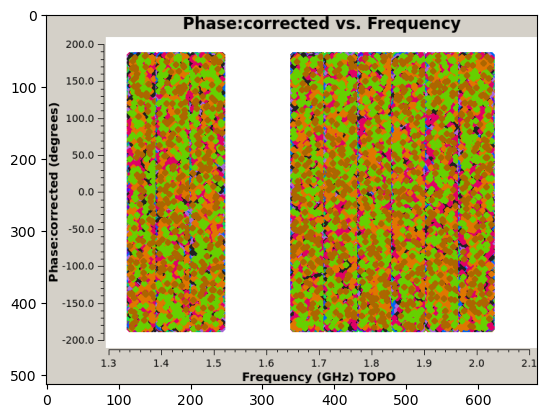

QSO J1212+0505


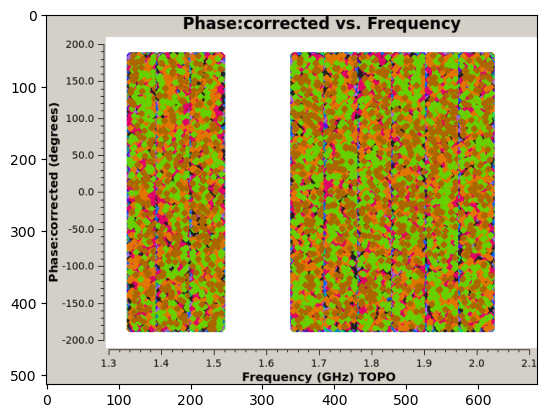

QSO J1207+0630


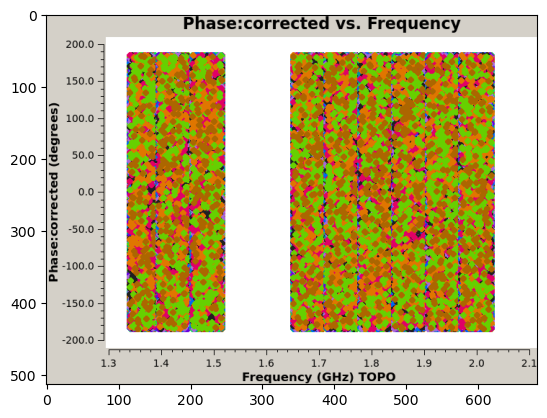

In [68]:
for field in fields.split(","):
    print(field)
    img = mpimg.imread(root + f"/plots/dataplots/{field}_phase_vs_freq_corrected.png")
    imgplot = plt.imshow(img)
    plt.show()

In [69]:

with h5py.File(root + f"/output/z_score_corrected.h5", "r") as f:
    z_score = f["z-score avg"][()]
    flags = f["flags avg"][()]
    freq_array = f["freq array"][()]
    time_array = f["time array"][()]
    ant_pairs = f["ant pairs"][()]
    dt = f["dt"][()]

# Load time integrations per scan
ntimes_file = os.path.join(root, f"output/ntimes.txt")
ntimes = np.loadtxt(ntimes_file).astype(int)

# time array
tisot = np.unique(Time(time_array, format="jd", scale="utc").isot)

z_score = np.ma.masked_array(z_score, mask=flags)

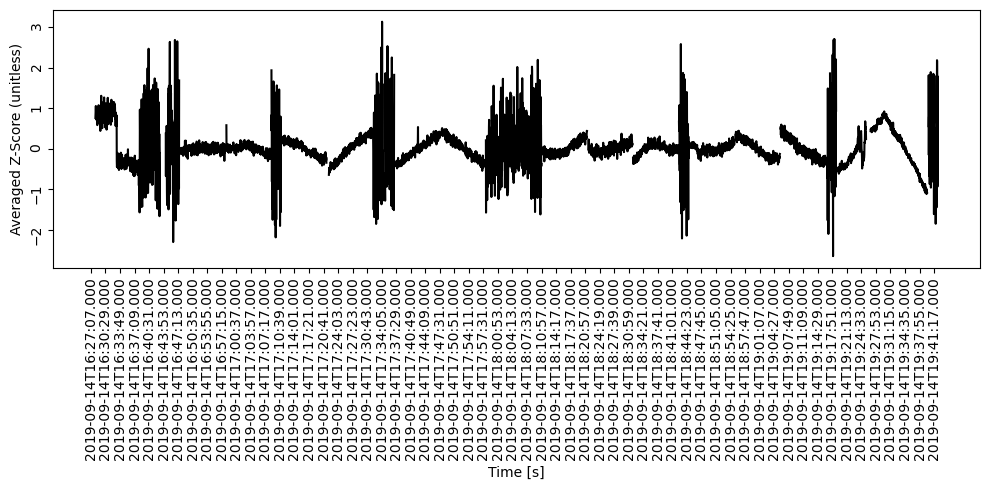

In [70]:
%matplotlib inline
fig, ax = plt.subplots(1, 1, figsize=(10, 5), sharex=True)
ax = inspect.plot_time_series(tisot, np.ma.median(z_score, axis=1), ax, plot_masked=True)
ax.set_ylabel("Averaged Z-Score (unitless)")
ax.set_xticks(tisot[::100])
plt.tight_layout()

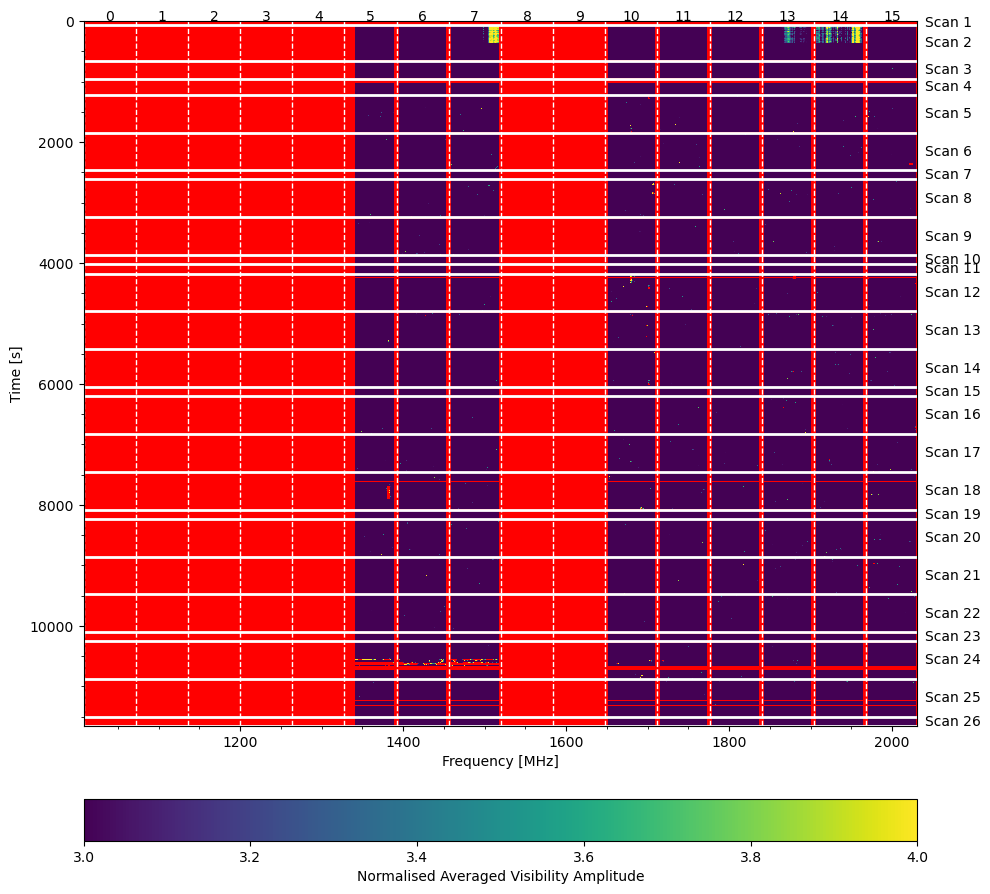

In [71]:
%matplotlib inline
fig, ax = plt.subplots(figsize=(10, 10))
ax, im = inspect.plot_wf(freq_array, z_score, 2, ntimes, vmin=3, vmax=4, cmap=cmap, ax=ax, plot_masked=True)
fig.colorbar(im, orientation="horizontal", pad=0.08, label="Normalised Averaged Visibility Amplitude")